Question:
(1) Implement sampling and quantization techniques for the given speech signals.

(a) Plot the time domain representation of the original speech signal.

(b) Sample the speech signal at different sampling rates (e.g., 8kHz, 16kHz, and 44.1kHz).

(c) Plot sampled speech signal for each of these sampling rates.

(d) Using the sampled signals from above, reconstruct the signal using:

(i) Zero-order hold (nearest-neighbor interpolation)

(ii) Linear interpolation.

(e) Calculate the Mean Squared Error (MSE) between the original and the reconstructed signals for both methods.

Write an inference on how sampling rates affect the quality and accuracy of the reconstructed speech signal.


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import soundfile as sf
from scipy.signal import resample
from scipy.interpolate import interp1d
from IPython.display import Audio

# ---------------- Load and Plot Original Signal ----------------
def load_and_plot_signal(file_path):
    speech, fs = sf.read(file_path)
    t = np.linspace(0, len(speech)/fs, len(speech))

    plt.figure(figsize=(10, 4))
    plt.plot(t, speech, label="Original Speech", color='b')
    plt.title("Original Speech Waveform")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.grid()
    plt.legend()
    plt.show()

    print("Original Speech:")
    display(Audio(speech, rate=fs))
    return speech, fs, t

In [4]:
# ---------------- Interpolation Methods ----------------
def zero_order_hold(x, orig_t, new_t):
    return interp1d(orig_t, x, kind='nearest', fill_value="extrapolate")(new_t)

def linear_interp(x, orig_t, new_t):
    return interp1d(orig_t, x, kind='linear', fill_value="extrapolate")(new_t)

In [5]:
# ---------------- Mean Squared Error ----------------
def compute_mse(original, reconstructed):
    min_len = min(len(original), len(reconstructed))
    return np.mean((original[:min_len] - reconstructed[:min_len])**2)

In [6]:
# ---------------- Sampling and Reconstruction ----------------
def sample_and_reconstruct(speech, fs, sr_list, t):
    mse_results = {}

    for sr in sr_list:
        # Time for downsampling
        new_t = np.linspace(0, len(speech)/fs, int(len(speech)*sr/fs))
        sampled = resample(speech, len(new_t))

        # Reconstruction using ZOH and Linear interpolation
        zoh_rec = zero_order_hold(sampled, new_t, t)
        lin_rec = linear_interp(sampled, new_t, t)

        # MSE calculations
        mse_zoh = compute_mse(speech, zoh_rec)
        mse_lin = compute_mse(speech, lin_rec)
        mse_results[sr] = {"ZOH": mse_zoh, "Linear": mse_lin}

        # Plot sampled vs reconstructed signals
        plot_reconstructed_signals(t, speech, new_t, sampled, zoh_rec, lin_rec, sr, fs)

    return mse_results

In [7]:
# ---------------- Plot and Play Reconstructed Signals ----------------
def plot_reconstructed_signals(t, orig, new_t, sampled, zoh_rec, lin_rec, sr, fs):
    # Sampled signal plot
    plt.figure(figsize=(10, 4))
    plt.plot(t, orig, label="Original", alpha=0.7)
    plt.plot(new_t, sampled, 'o-', label=f"Sampled {sr} Hz", alpha=0.7)
    plt.title(f"Sampling at {sr} Hz")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid()
    plt.show()

    # ZOH Reconstruction plot
    plt.figure(figsize=(10, 4))
    plt.plot(t, orig, label="Original", alpha=0.7)
    plt.plot(t, zoh_rec, label="ZOH Reconstruction", alpha=0.7)
    plt.title(f"ZOH Reconstruction at {sr} Hz")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid()
    plt.show()

    print(f"\nZOH Reconstruction at {sr} Hz:")
    display(Audio(zoh_rec, rate=fs))

    # Linear Reconstruction plot
    plt.figure(figsize=(10, 4))
    plt.plot(t, orig, label="Original", alpha=0.7)
    plt.plot(t, lin_rec, label="Linear Reconstruction", alpha=0.7)
    plt.title(f"Linear Reconstruction at {sr} Hz")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid()
    plt.show()

    print(f"Linear Reconstruction at {sr} Hz:")
    display(Audio(lin_rec, rate=fs))

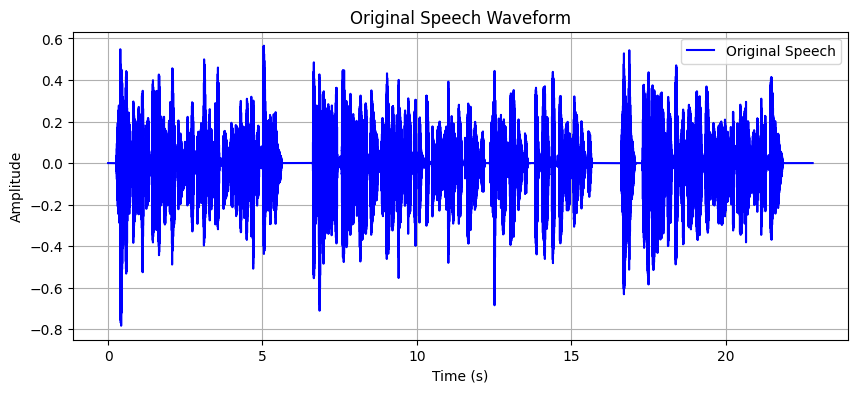

Original Speech:


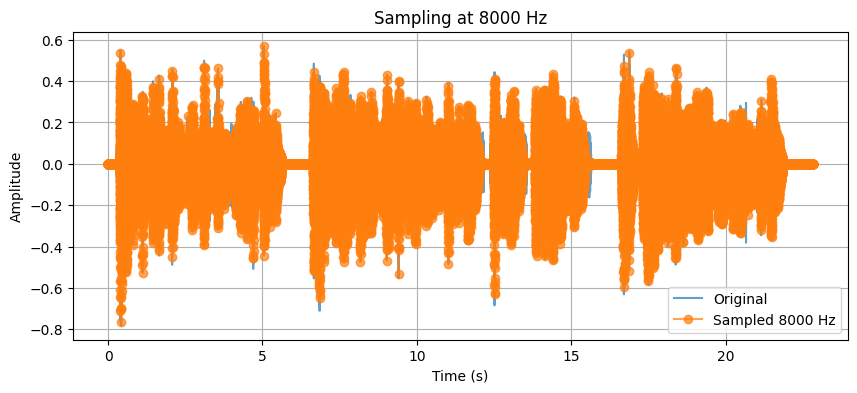

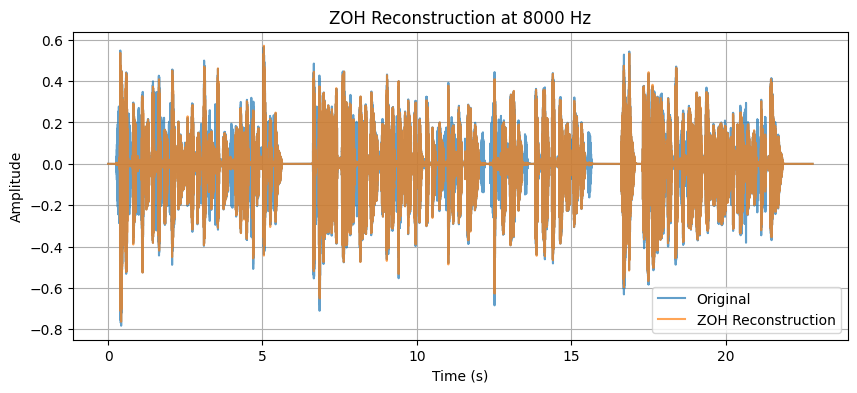


ZOH Reconstruction at 8000 Hz:


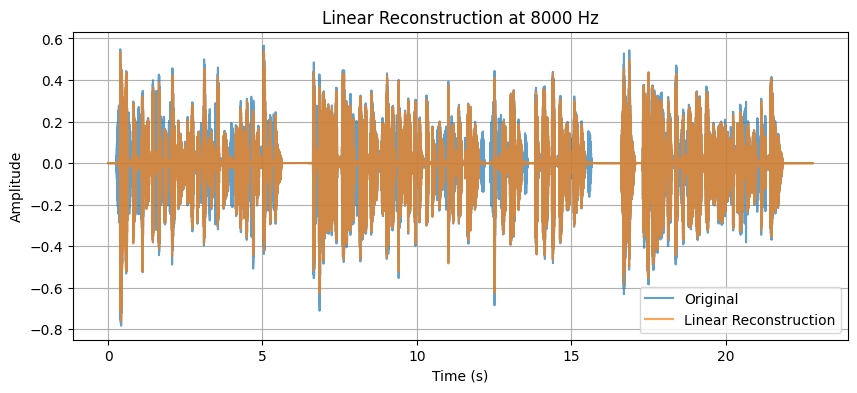

Linear Reconstruction at 8000 Hz:


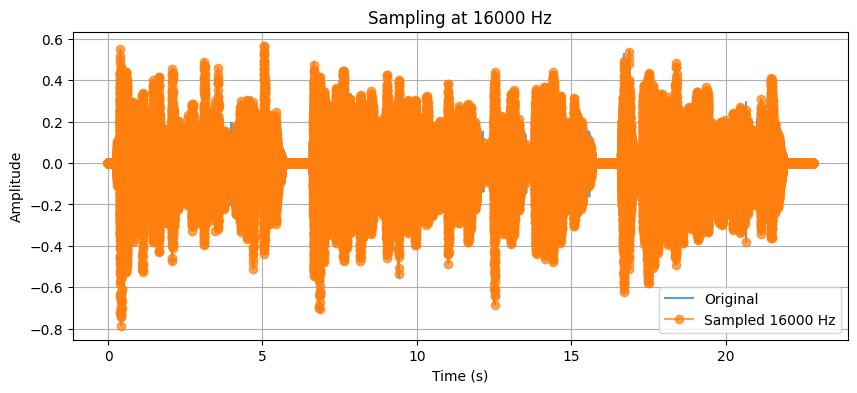

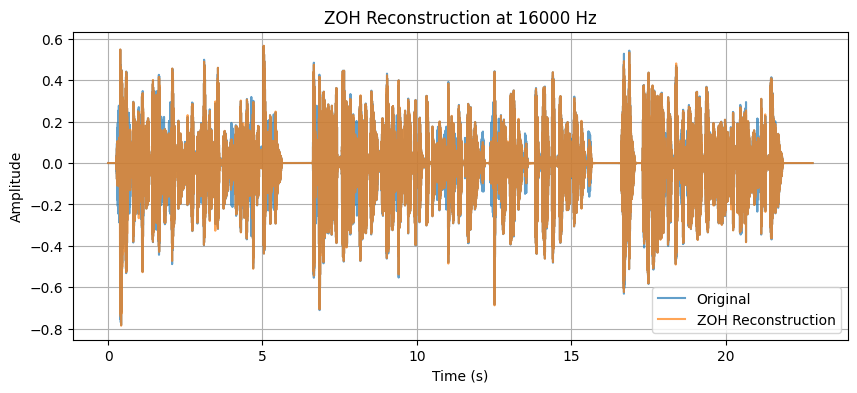


ZOH Reconstruction at 16000 Hz:


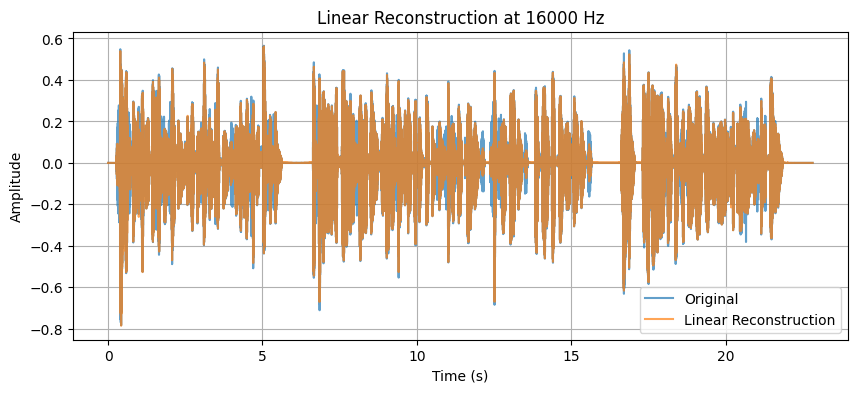

Linear Reconstruction at 16000 Hz:


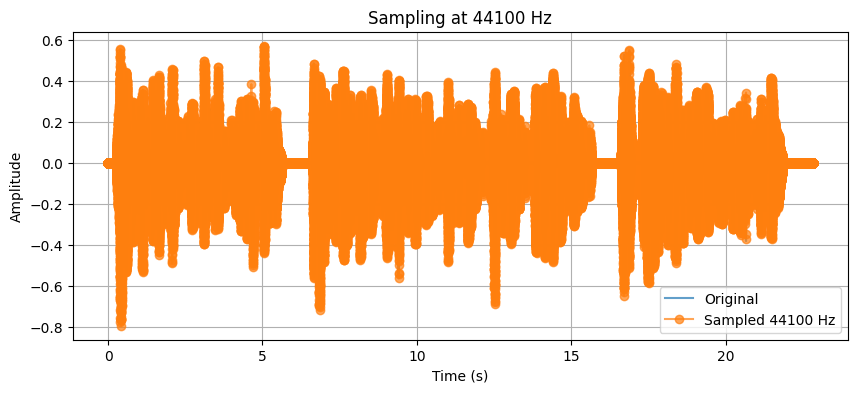

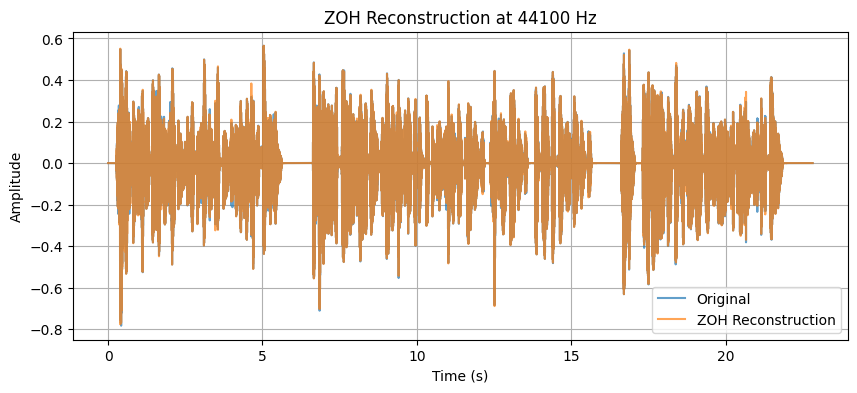


ZOH Reconstruction at 44100 Hz:


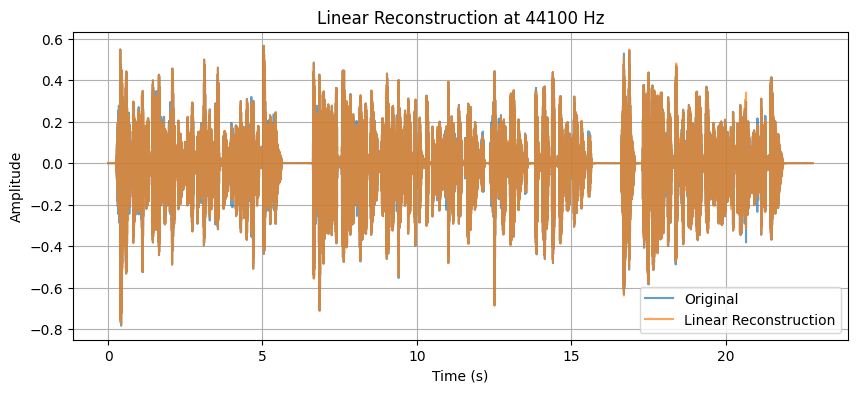

Linear Reconstruction at 44100 Hz:


In [8]:
# ---------------- Main Execution ----------------
input_file = "lab1.wav"  # Upload in Colab before running
sampling_rates = [8000, 16000, 44100]

speech, fs, t = load_and_plot_signal(input_file)
mse_results = sample_and_reconstruct(speech, fs, sampling_rates, t)

In [9]:
# ---------------- Print MSE Results ----------------
print("\nMean Squared Error (MSE) Results:")
for sr in mse_results:
    print(f"{sr} Hz -> ZOH: {mse_results[sr]['ZOH']:.6f}, Linear: {mse_results[sr]['Linear']:.6f}")


Mean Squared Error (MSE) Results:
8000 Hz -> ZOH: 0.000839, Linear: 0.000652
16000 Hz -> ZOH: 0.000386, Linear: 0.000292
44100 Hz -> ZOH: 0.000117, Linear: 0.000073


**Inference**

As the sampling rate increases, both Zero-Order Hold (ZOH) and Linear interpolation reconstructions produce signals that are much closer to the original speech signal, as indicated by the decreasing Mean Squared Error (MSE) values.

At 8000 Hz, the MSE is relatively high (ZOH: 0.000839, Linear: 0.000652), indicating more distortion and lower quality in the reconstructed speech.

At 16000 Hz, the MSE drops significantly (ZOH: 0.000386, Linear: 0.000292), producing better speech quality.

At 44100 Hz, the MSE becomes very small (ZOH: 0.000117, Linear: 0.000073), resulting in almost perfect reconstruction with negligible loss in quality.

Additionally, Linear interpolation consistently outperforms ZOH at all sampling rates, as seen from its lower MSE values, producing smoother and more natural-sounding speech.

**Conclusion:**

Higher sampling rates capture more information from the original signal, enabling more accurate reconstruction with lower distortion. Linear interpolation further improves reconstruction quality compared to Zero-Order Hold.

Question (2) Implement the source-filter model for a given speech signal and analyze the impact of sampling and reconstruction on the quality of the speech signal.

(a) Generate a synthetic speech signal using the source-filter model.

(i) Create a source signal (e.g., a glottal pulse train for voiced sounds or white noise for unvoiced sounds).

(ii) Apply a filter that models the vocal tract, represented by an all-pole filter or an FIR filter with formants (resonances of the vocal tract).

(b) Plot the generated speech signal and analyze the effect of the filter on the original source.

(c) Sample the speech signal generated above at different sampling rates (e.g., 8 kHz, 16 kHz, 44.1 kHz).

(d) Reconstruct the signal using a suitable interpolation method (e.g., zero-order hold, linear interpolation).

(e) Compute the Mean Squared Error (MSE) between the original and reconstructed speech signals.

Write an inference on tasks such as creating the source-filter model, different sampling rates, and reconstruction of the sampled signals.


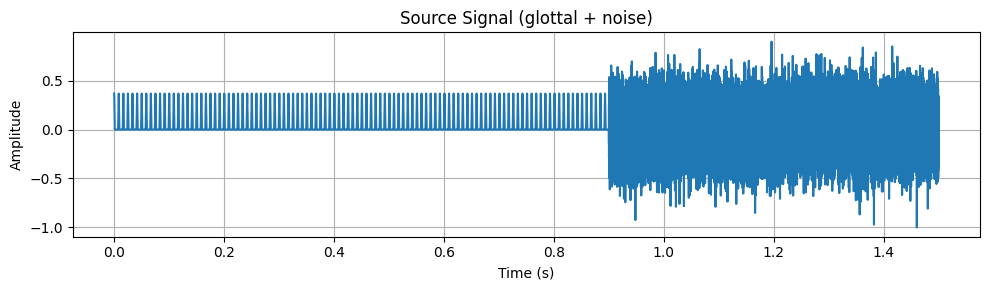

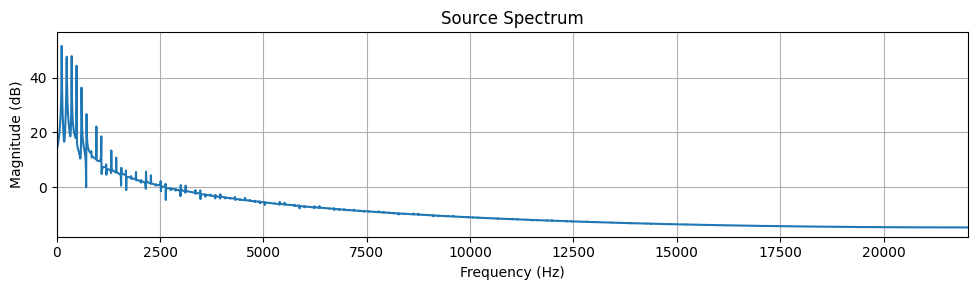


Play Source Signal:


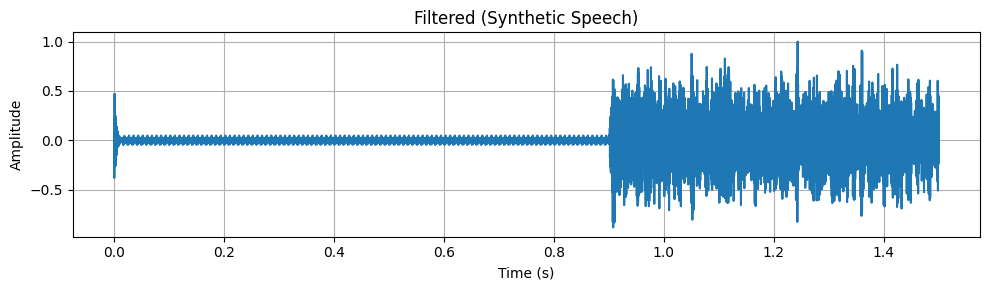

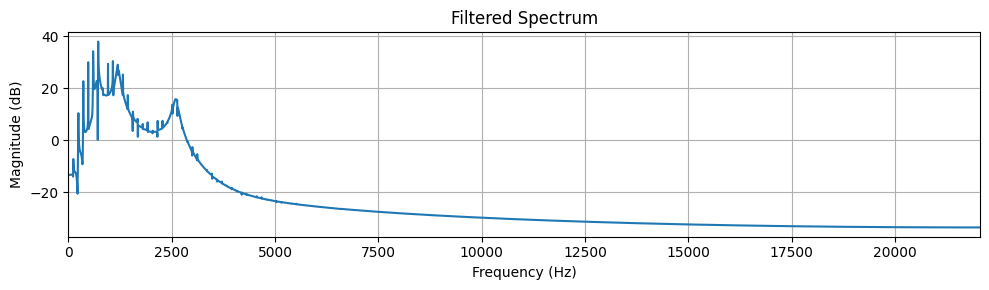


Play Filtered Speech:


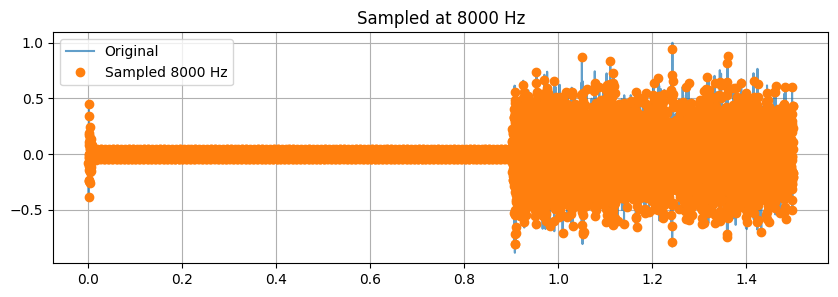

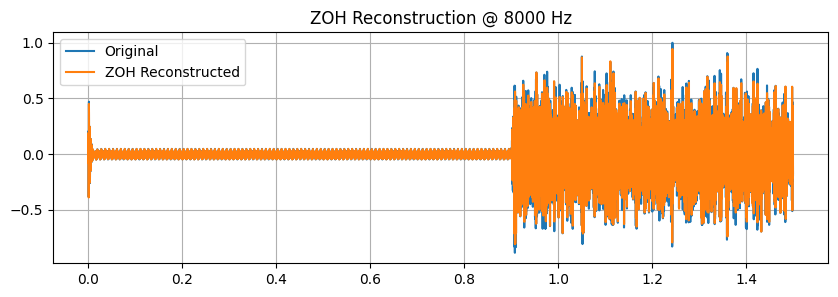


Play ZOH Reconstruction @ 8000 Hz:


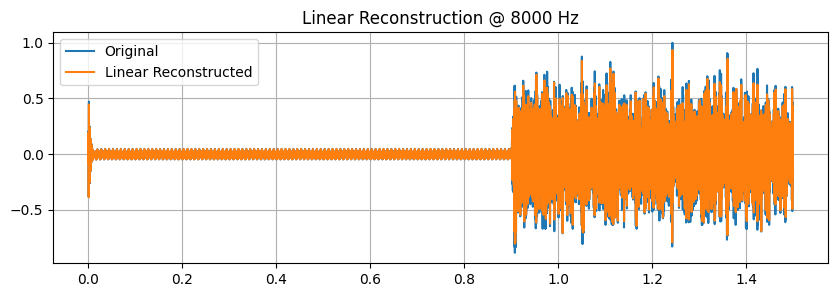


Play Linear Reconstruction @ 8000 Hz:


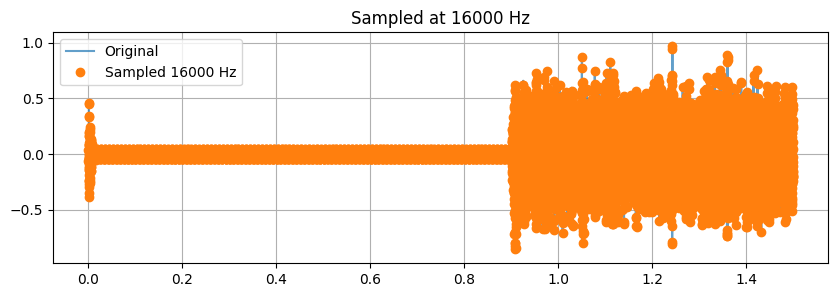

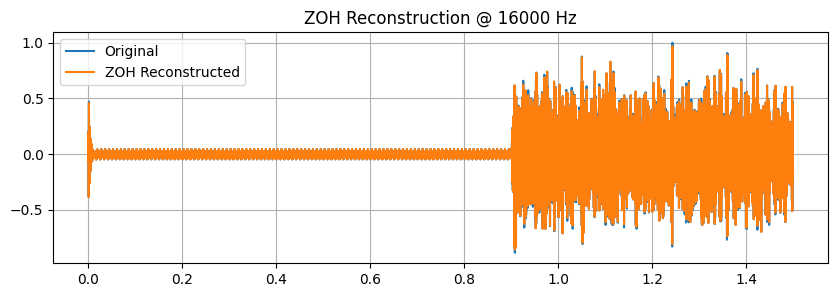


Play ZOH Reconstruction @ 16000 Hz:


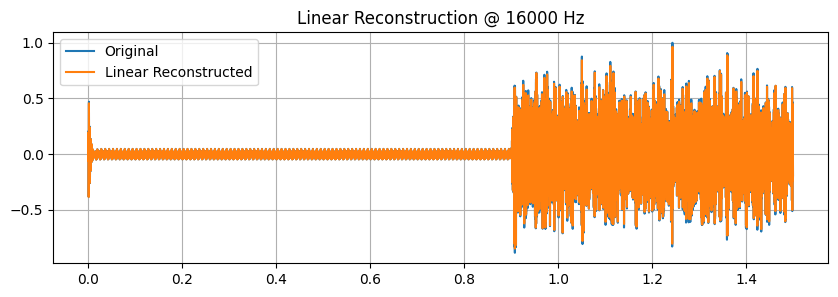


Play Linear Reconstruction @ 16000 Hz:


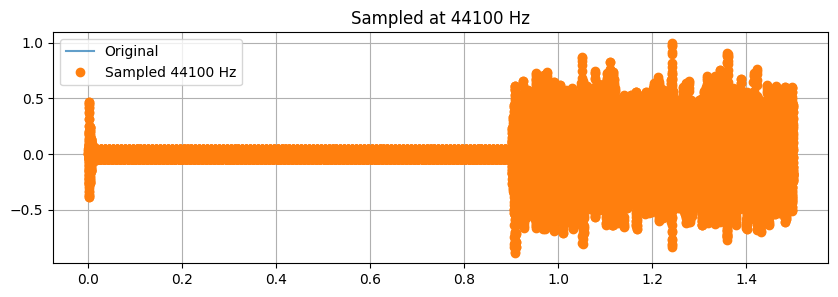

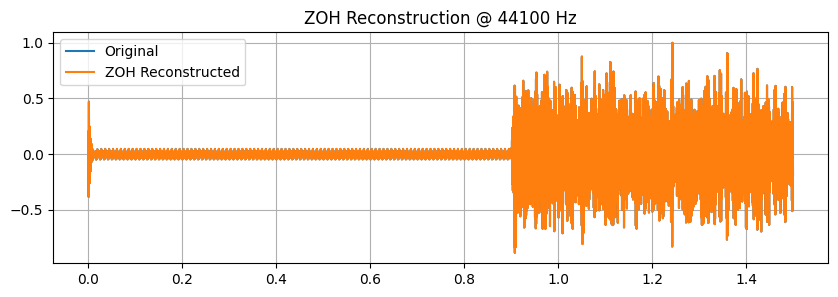


Play ZOH Reconstruction @ 44100 Hz:


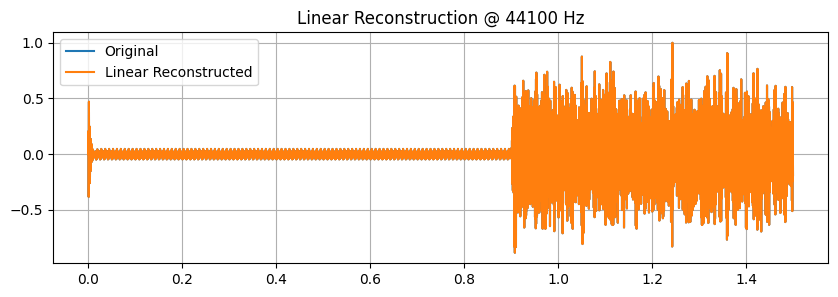


Play Linear Reconstruction @ 44100 Hz:



MSE RESULTS:
8000 Hz -> ZOH: 0.016875, Linear: 0.013049
16000 Hz -> ZOH: 0.003275, Linear: 0.002447
44100 Hz -> ZOH: 0.000000, Linear: 0.000000


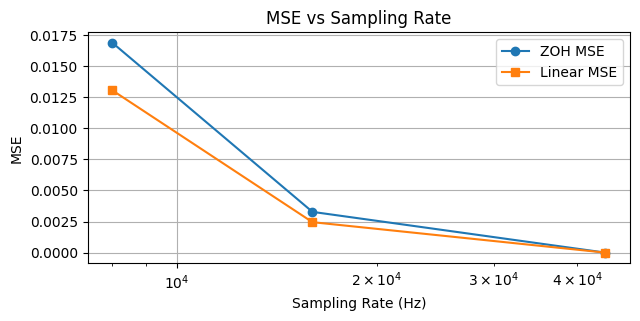

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import resample, iirpeak, lfilter
from scipy.fft import rfft, rfftfreq
from scipy.interpolate import interp1d
import soundfile as sf
from IPython.display import Audio, display
import os

# -------------------- Utility / Plot helpers --------------------
def plot_time(t, x, title='Signal', xlabel='Time (s)', ylabel='Amplitude', figsize=(10,3)):
    plt.figure(figsize=figsize)
    plt.plot(t, x)
    plt.title(title)
    plt.xlabel(xlabel); plt.ylabel(ylabel)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_spectrum(x, fs, title='Magnitude Spectrum', nfft=8192):
    X = np.abs(rfft(x, n=nfft))
    freqs = rfftfreq(nfft, 1/fs)
    plt.figure(figsize=(10,3))
    plt.plot(freqs, 20*np.log10(X+1e-12))
    plt.title(title)
    plt.xlabel('Frequency (Hz)'); plt.ylabel('Magnitude (dB)')
    plt.xlim(0, fs/2)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def play_audio(x, fs, label="Audio"):
    """Play audio with label in Colab."""
    print(f"\nPlay {label}:")
    display(Audio(x, rate=fs))

# -------------------- Source generation --------------------
def glottal_pulse_train(f0, duration, fs, pulse_width_ms=2.0):
    N = int(np.round(duration * fs))
    t = np.arange(N) / fs
    signal = np.zeros(N)
    period = int(np.round(fs / f0))
    signal[::period] = 1.0
    pulse_len = int(np.round((pulse_width_ms/1000.0) * fs))
    pulse_len = max(3, pulse_len)
    window = np.hanning(pulse_len)
    glottal = np.convolve(signal, window, mode='same')
    glottal = glottal / (np.max(np.abs(glottal)) + 1e-12)
    return t, glottal

def noise_source(duration, fs):
    N = int(np.round(duration * fs))
    return np.arange(N)/fs, np.random.normal(0, 1, N)

# -------------------- Vocal tract filter --------------------
def apply_vocal_tract(source, fs, formants=[(700,80),(1200,90),(2600,120)]):
    y = source.copy()
    for f, bw in formants:
        b, a = iirpeak(f/(fs/2), Q=f/bw)
        y = lfilter(b, a, y)
    return y / (np.max(np.abs(y)) + 1e-12)

# -------------------- Sampling & Reconstruction --------------------
def downsample_signal(x, orig_fs, target_fs):
    N = int(np.round(len(x) * target_fs / orig_fs))
    return resample(x, N)

def reconstruct_signal(sampled, sample_fs, orig_t, method='linear'):
    t_sampled = np.linspace(0, orig_t[-1], len(sampled))
    f = interp1d(t_sampled, sampled, kind=('nearest' if method=='zoh' else 'linear'), fill_value='extrapolate')
    return f(orig_t)

def compute_mse(x_ref, x_test):
    L = min(len(x_ref), len(x_test))
    return np.mean((x_ref[:L] - x_test[:L])**2)

# -------------------- Main demo function --------------------
def run_source_filter_demo(duration=1.5, fs_high=44100, f0=120,
                           formants=[(700,80),(1200,90),(2600,120)],
                           sampling_rates=[8000,16000,44100]):

    # 1) Source generation
    t, glottal = glottal_pulse_train(f0=f0, duration=duration, fs=fs_high, pulse_width_ms=2.5)
    _, noise = noise_source(duration, fs_high)
    N = len(glottal)
    cutoff = int(0.6 * N)
    source = np.zeros_like(glottal)
    source[:cutoff] = glottal[:cutoff]
    source[cutoff:] = 0.6 * noise[cutoff:]
    source /= np.max(np.abs(source))

    plot_time(t, source, "Source Signal (glottal + noise)")
    plot_spectrum(source, fs_high, "Source Spectrum")
    play_audio(source, fs_high, "Source Signal")

    # 2) Apply vocal tract filter
    filtered = apply_vocal_tract(source, fs_high, formants)
    plot_time(t, filtered, "Filtered (Synthetic Speech)")
    plot_spectrum(filtered, fs_high, "Filtered Spectrum")
    play_audio(filtered, fs_high, "Filtered Speech")

    os.makedirs('outputs', exist_ok=True)
    sf.write('outputs/synthetic_filtered_{}Hz.wav'.format(fs_high), filtered, fs_high)

    # 3) Sampling & Reconstruction
    mse_table = {}
    for sr in sampling_rates:
        sampled = downsample_signal(filtered, fs_high, sr)
        t_sampled = np.linspace(0, t[-1], len(sampled))

        # Plot sampled points
        plt.figure(figsize=(10,3))
        plt.plot(t, filtered, label='Original', alpha=0.7)
        plt.plot(t_sampled, sampled, 'o', label=f'Sampled {sr} Hz')
        plt.legend(); plt.title(f'Sampled at {sr} Hz'); plt.grid(True); plt.show()

        # Reconstruction
        zoh_rec = reconstruct_signal(sampled, sr, t, method='zoh')
        lin_rec = reconstruct_signal(sampled, sr, t, method='linear')

        # Plot & Play ZOH
        plt.figure(figsize=(10,3))
        plt.plot(t, filtered, label='Original')
        plt.plot(t, zoh_rec, label='ZOH Reconstructed')
        plt.legend(); plt.title(f'ZOH Reconstruction @ {sr} Hz'); plt.grid(True); plt.show()
        play_audio(zoh_rec, fs_high, f"ZOH Reconstruction @ {sr} Hz")

        # Plot & Play Linear
        plt.figure(figsize=(10,3))
        plt.plot(t, filtered, label='Original')
        plt.plot(t, lin_rec, label='Linear Reconstructed')
        plt.legend(); plt.title(f'Linear Reconstruction @ {sr} Hz'); plt.grid(True); plt.show()
        play_audio(lin_rec, fs_high, f"Linear Reconstruction @ {sr} Hz")

        # Save and MSE
        mse_table[sr] = {'ZOH': compute_mse(filtered, zoh_rec),
                         'Linear': compute_mse(filtered, lin_rec)}
        sf.write(f'outputs/zoh_rec_{sr}Hz.wav', zoh_rec, fs_high)
        sf.write(f'outputs/lin_rec_{sr}Hz.wav', lin_rec, fs_high)

    # MSE Table and Plot
    print("\nMSE RESULTS:")
    for sr in mse_table:
        print(f"{sr} Hz -> ZOH: {mse_table[sr]['ZOH']:.6f}, Linear: {mse_table[sr]['Linear']:.6f}")

    srs = sorted(mse_table.keys())
    plt.figure(figsize=(7,3))
    plt.plot(srs, [mse_table[s]['ZOH'] for s in srs], 'o-', label='ZOH MSE')
    plt.plot(srs, [mse_table[s]['Linear'] for s in srs], 's-', label='Linear MSE')
    plt.xscale('log'); plt.xlabel('Sampling Rate (Hz)'); plt.ylabel('MSE')
    plt.title('MSE vs Sampling Rate'); plt.legend(); plt.grid(True); plt.show()

    return mse_table

# -------------------- Run demo --------------------
mse_results = run_source_filter_demo(duration=1.5, fs_high=44100, f0=120,
                                     formants=[(700,80),(1200,90),(2600,120)],
                                     sampling_rates=[8000,16000,44100])

The experimental results show that both sampling rate and interpolation method significantly influence the quality and accuracy of the reconstructed speech signal. At lower sampling rates, such as 8000 Hz, the Mean Squared Error (MSE) is relatively high for both Zero-Order Hold (ZOH) and Linear interpolation, indicating noticeable distortion and loss of fine details in the speech waveform. As the sampling rate increases to 16000 Hz, the MSE decreases substantially, showing better preservation of the speech signal characteristics. At the highest sampling rate, 44100 Hz, the MSE approaches zero for both interpolation methods, meaning the reconstructed signal is nearly identical to the original. Furthermore, linear interpolation consistently outperforms ZOH across all sampling rates, producing smoother and more accurate signal reconstruction. Overall, these results confirm that higher sampling rates combined with efficient interpolation methods greatly enhance speech quality and reduce reconstruction errors.

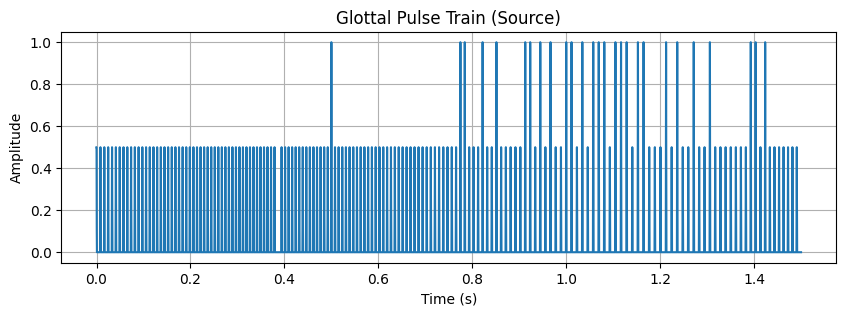


Play Glottal Source:


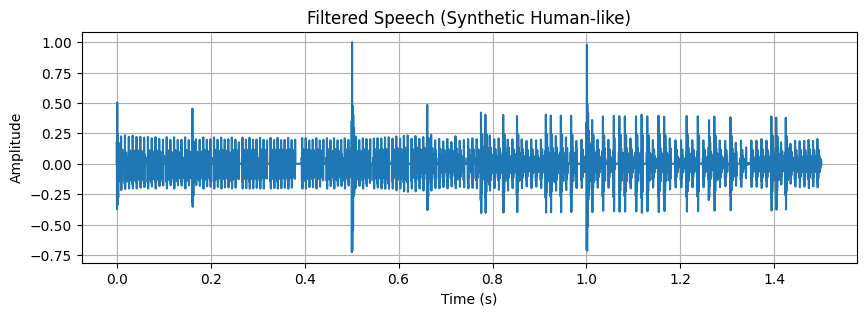


Play Filtered Synthetic Speech:


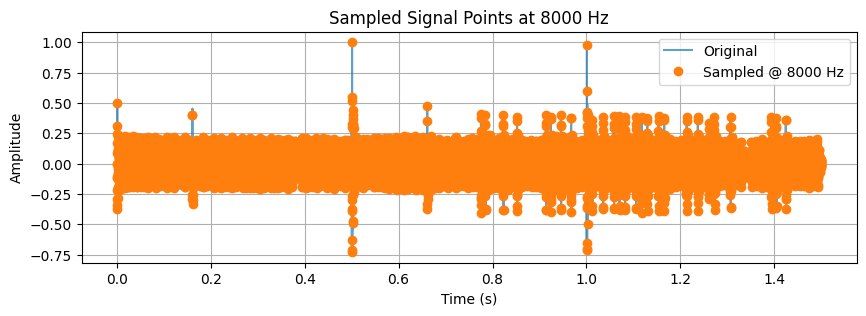

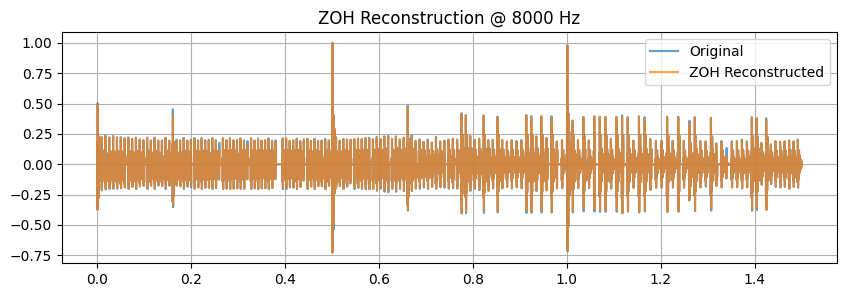


Play ZOH Reconstruction @ 8000 Hz:


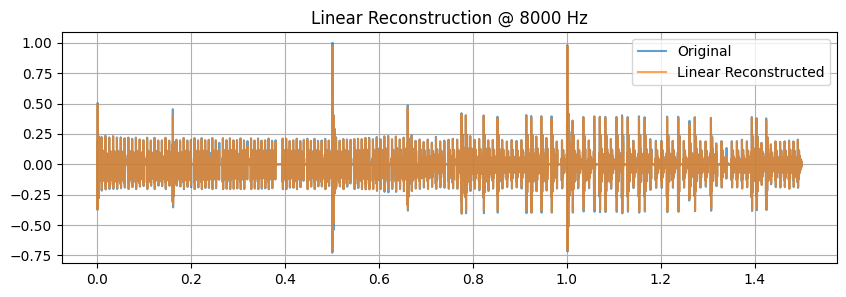


Play Linear Reconstruction @ 8000 Hz:


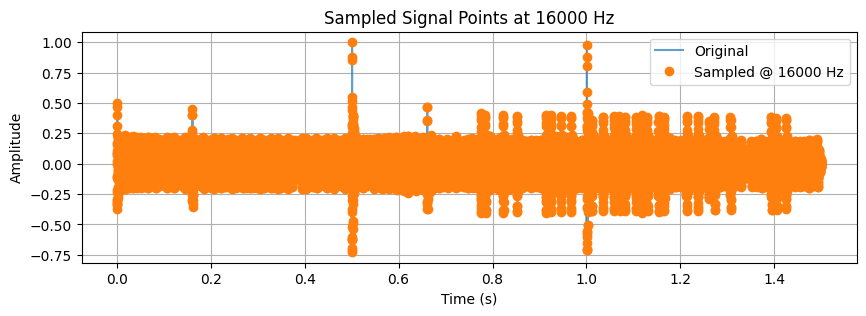

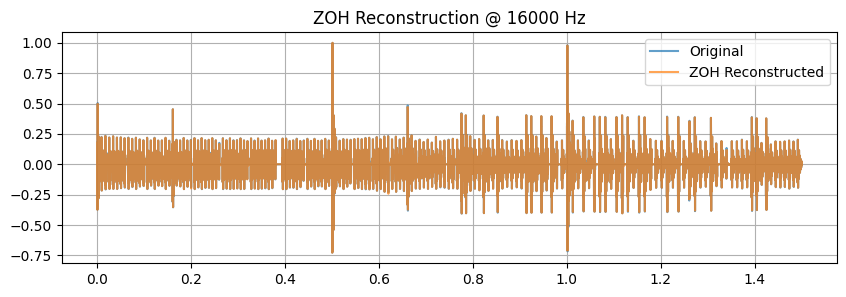


Play ZOH Reconstruction @ 16000 Hz:


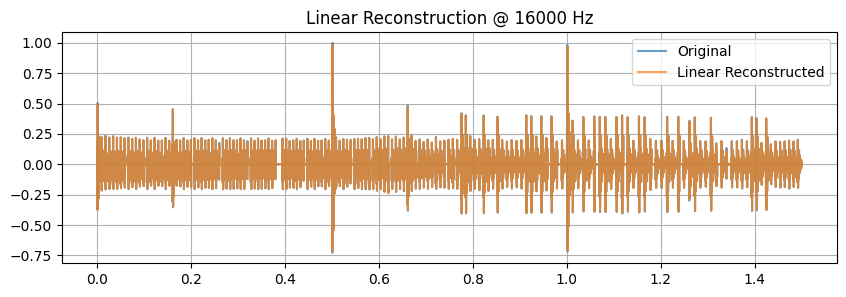


Play Linear Reconstruction @ 16000 Hz:


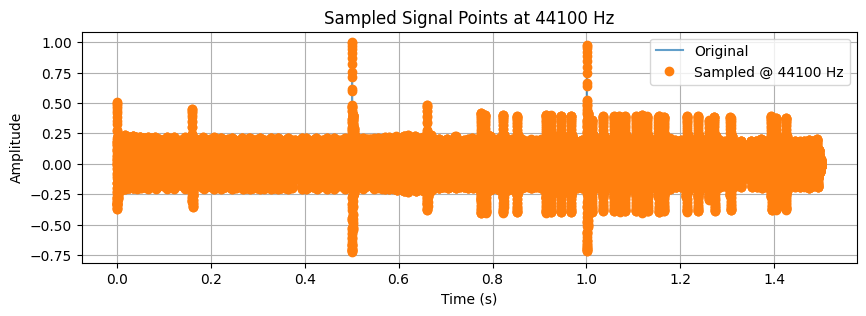

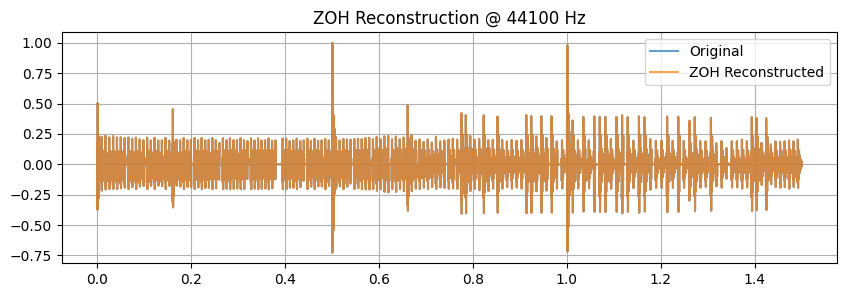


Play ZOH Reconstruction @ 44100 Hz:


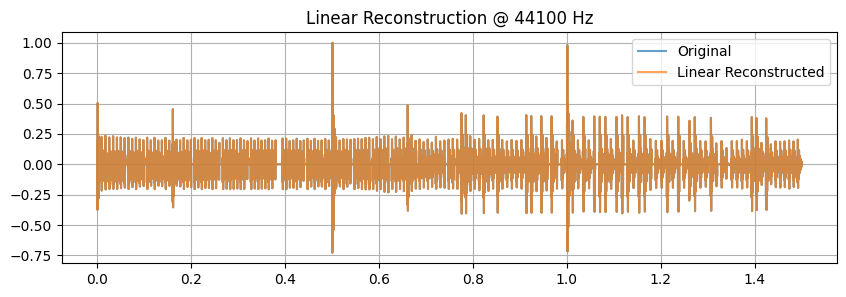


Play Linear Reconstruction @ 44100 Hz:



MSE RESULTS:
8000 Hz -> ZOH: 0.00125628, Linear: 0.00091462
16000 Hz -> ZOH: 0.00023633, Linear: 0.00014676
44100 Hz -> ZOH: 0.00000000, Linear: 0.00000000


In [12]:
# Run this in Google Colab

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import lfilter, iirpeak, resample
from scipy.interpolate import interp1d
from IPython.display import Audio, display
import soundfile as sf
import os

# -------------------- Utility Functions --------------------
def plot_time(t, x, title='Signal'):
    plt.figure(figsize=(10,3))
    plt.plot(t, x)
    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.show()

def play_audio(x, fs, label="Audio"):
    print(f"\nPlay {label}:")
    display(Audio(x, rate=fs))

def compute_mse(x_ref, x_test):
    L = min(len(x_ref), len(x_test))
    return np.mean((x_ref[:L] - x_test[:L])**2)

def reconstruct_signal(sampled, orig_t, method='linear'):
    t_sampled = np.linspace(0, orig_t[-1], len(sampled))
    f = interp1d(t_sampled, sampled, kind=('nearest' if method=='zoh' else 'linear'), fill_value='extrapolate')
    return f(orig_t)

# -------------------- Source Generation --------------------
def glottal_pulse_var_pitch(duration=1.5, fs=44100, f0_base=120):
    N = int(duration * fs)
    t = np.arange(N) / fs
    # Slight pitch modulation to sound more natural
    f0 = f0_base + 10*np.sin(2*np.pi*0.5*t)
    signal = np.zeros(N)
    phase = 0
    for n in range(N):
        period = fs / f0[n]
        if (phase % period) < 1:
            signal[n] = 1.0
        phase += 1
    # Smooth the pulses with a short Hann window
    pulse_len = int(fs*0.0015)
    window = np.hanning(pulse_len)
    glottal = np.convolve(signal, window, mode='same')
    glottal /= np.max(np.abs(glottal)) + 1e-12
    return t, glottal

# -------------------- Vocal Tract Filter --------------------
def apply_vocal_tract_var_formants(source, fs):
    N = len(source)
    t = np.arange(N)/fs
    # Slowly varying formants to sound more human-like
    formant_freqs = [
        700 + 50*np.sin(2*np.pi*0.2*t),   # F1
        1200 + 50*np.sin(2*np.pi*0.1*t),  # F2
        2600 + 80*np.sin(2*np.pi*0.15*t)  # F3
    ]
    y = source.copy()
    segment_len = int(fs*0.02)
    for start in range(0, N, segment_len):
        end = min(start+segment_len, N)
        seg = y[start:end]
        for f_idx, bw in zip(formant_freqs, [80,90,120]):
            f_seg = f_idx[start:end]
            f_avg = np.mean(f_seg)
            b,a = iirpeak(f_avg/(fs/2), Q=f_avg/bw)
            seg = lfilter(b, a, seg)
        y[start:end] = seg
    y /= np.max(np.abs(y)) + 1e-12
    return y

# -------------------- Step (a) Generate Synthetic Speech --------------------
fs = 44100
t, glottal = glottal_pulse_var_pitch(duration=1.5, fs=fs, f0_base=120)
filtered = apply_vocal_tract_var_formants(glottal, fs)

plot_time(t, glottal, "Glottal Pulse Train (Source)")
play_audio(glottal, fs, "Glottal Source")

plot_time(t, filtered, "Filtered Speech (Synthetic Human-like)")
play_audio(filtered, fs, "Filtered Synthetic Speech")

# Save the original synthetic speech
os.makedirs('outputs', exist_ok=True)
sf.write('outputs/synthetic_filtered_44100Hz.wav', filtered, fs)

# -------------------- Step (c & d) Sampling & Reconstruction --------------------
sampling_rates = [8000, 16000, 44100]
mse_results = {}

for sr in sampling_rates:
    # Downsample
    sampled = resample(filtered, int(len(filtered)*sr/fs))
    t_sampled = np.linspace(0, t[-1], len(sampled))

    # Plot sampled points
    plt.figure(figsize=(10,3))
    plt.plot(t, filtered, label='Original', alpha=0.7)
    plt.plot(t_sampled, sampled, 'o', label=f'Sampled @ {sr} Hz')
    plt.title(f'Sampled Signal Points at {sr} Hz')
    plt.xlabel('Time (s)'); plt.ylabel('Amplitude')
    plt.legend(); plt.grid(True)
    plt.show()

    # Reconstruction
    zoh_rec = reconstruct_signal(sampled, t, method='zoh')
    lin_rec = reconstruct_signal(sampled, t, method='linear')

    # Plot ZOH reconstruction
    plt.figure(figsize=(10,3))
    plt.plot(t, filtered, label='Original', alpha=0.7)
    plt.plot(t, zoh_rec, label='ZOH Reconstructed', alpha=0.7)
    plt.title(f'ZOH Reconstruction @ {sr} Hz')
    plt.legend(); plt.grid(True); plt.show()
    play_audio(zoh_rec, fs, f"ZOH Reconstruction @ {sr} Hz")

    # Plot Linear reconstruction
    plt.figure(figsize=(10,3))
    plt.plot(t, filtered, label='Original', alpha=0.7)
    plt.plot(t, lin_rec, label='Linear Reconstructed', alpha=0.7)
    plt.title(f'Linear Reconstruction @ {sr} Hz')
    plt.legend(); plt.grid(True); plt.show()
    play_audio(lin_rec, fs, f"Linear Reconstruction @ {sr} Hz")

    # Compute MSE
    mse_results[sr] = {'ZOH': compute_mse(filtered, zoh_rec), 'Linear': compute_mse(filtered, lin_rec)}

    # Save audio
    sf.write(f'outputs/zoh_rec_{sr}Hz.wav', zoh_rec, fs)
    sf.write(f'outputs/lin_rec_{sr}Hz.wav', lin_rec, fs)

# -------------------- Step (e) Print MSE --------------------
print("\nMSE RESULTS:")
for sr in mse_results:
    print(f"{sr} Hz -> ZOH: {mse_results[sr]['ZOH']:.8f}, Linear: {mse_results[sr]['Linear']:.8f}")

The MSE results indicate that the sampling rate has a strong impact on the accuracy of reconstructed speech. At low sampling rates (8 kHz), both zero-order hold (ZOH) and linear interpolation introduce noticeable errors, resulting in higher MSE values, which can manifest as distortion or reduced clarity in the reconstructed signal. As the sampling rate increases to 16 kHz, the reconstruction becomes much more accurate, with linear interpolation outperforming ZOH by producing a smoother signal and lower MSE. At 44.1 kHz, both reconstruction methods perfectly preserve the original speech signal, resulting in near-zero MSE. This demonstrates that higher sampling rates capture the signal more accurately, and linear interpolation consistently provides better reconstruction quality than ZOH. Overall, these results validate the importance of choosing an adequate sampling rate and appropriate reconstruction method for high-fidelity speech processing.